In [1]:
nextfloat(x::Float32) = (a = eps(x); x+a)

nextfloat (generic function with 1 method)

In [2]:
decode(x::Float32) = (b=bitstring(x); (b[1], b[2:9], b[10:32]))
decode(x::Float64) = (b=bitstring(x); (b[1], b[2:9], b[10:64]))

decode (generic function with 2 methods)

In [3]:
using Plots

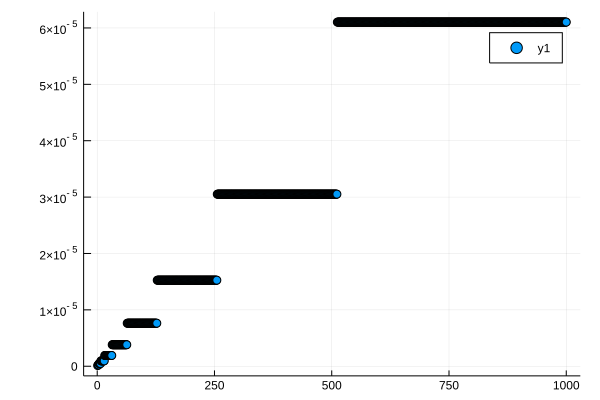

In [4]:
scatter(1:1:1000, [nextfloat(a) - a for a in Float32(1):1000])

In [5]:
decode(Float32(1.3))

('0', "01111111", "01001100110011001100110")

In [6]:
decode(Float32(-1.3))

('1', "01111111", "01001100110011001100110")

In [7]:
function xn_unstable(n::Int64)::Float64 
    if n == 0
        return 1
    end
    if n == 1
        return 1/3
    end
    return 13/3*xn_unstable(n-1) - 4/3*xn_unstable(n-2)
end

xn_stable(n::Int64)::Float64 = (1/3)^n

xn_stable (generic function with 1 method)

In [8]:
xn_unstable(2)

0.11111111111111094

In [9]:
xn_stable(2)

0.1111111111111111

In [10]:
xn_unstable(15)

5.63988753916179e-8

In [11]:
xn_stable(15)

6.969171937625627e-8

In [12]:
n = 15
abs(xn_stable(n)-xn_unstable(n))/xn_stable(n)*100

19.073778210108554

In [16]:
rel_error(n) = abs(xn_stable(n)-xn_unstable(n))/xn_stable(n)*100

rel_error (generic function with 1 method)

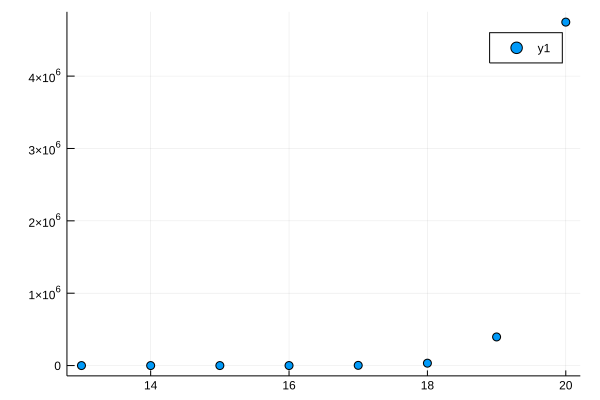

In [15]:
scatter(13:1:20, [rel_error(a) for a in 13:20])